# Introduction to napari

napari is a n-dimensional image visualizer for the Python world. While it was already possible to visualize simple images (e.g. in Matplotlib) or even volumes (e.g [itkwidgets](https://github.com/InsightSoftwareConsortium/itkwidgets) in Python), napari is the first Python software providing the full expected palette of possibilities to visualize, analyze and interact with n-dimensional images. One key feature of napari is the possibility to easily extend its base functionalities via plugins which are relatively easy to develop. napari has already a rich eco-system of plugins for many tasks such as segmentation, tracking, registration etc. Officially released plugins can be found on the [napari-hub](https://www.napari-hub.org/).

## Different usages

napari can be used as a stand-alone application. For example you can just type ```napari``` in a terminal which will launch a napari session. There one can operate interactively but a scripting window is also available where one can input commands. While this is fine for short and simple tasks, it is not a good solution for more complex endeavors. In the latter case, the best solution is to start an interactive computing session e.g. with Jupyter and to launch napari from there. In that case napari and Jupyter are integrated "bidirectionally" i.e. one can control napari from Jupyter (adding images, adjusting rendering etc.) and one can operate in napari (e.g. annotate an image) and recover the results in Jupyter. 

To use napari from a notebook one first needs to import it as a regular package:

In [121]:
import napari

The one needs to create an instance of a napari application called a **Viewer**.

## The viewer

The ```Viewer``` is the central element of napari and is the place where the image, controls and plugins are displayed.

In [122]:
viewer = napari.Viewer()

Executing the above line creates an interface window *outside* the notebook. This is the main reason why napari cannot really be used remotely, as it always opens like a desktop application. To still be able to visualize the window in notebooks we use the following utility:

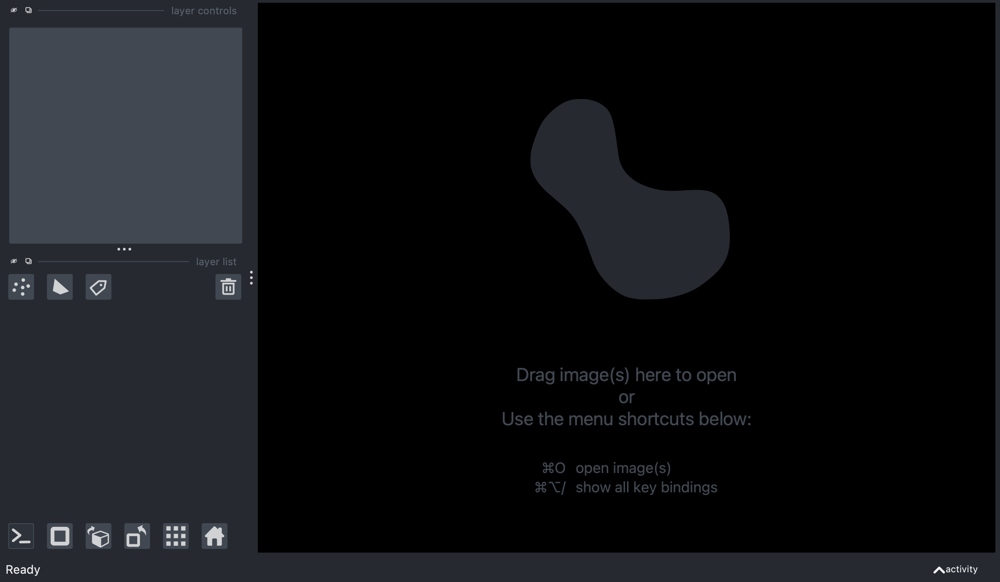

In [123]:
from napari.utils import nbscreenshot

nbscreenshot(viewer, alt_text='Initial window')

From that window, we can use the menu (not shown above) to interact with napari e.g. to load an image. As we created the ```Viewer``` inside the notebook, we can also play with ```viewer``` to programmatically open images and process them. We will see later how to add *any* image to the viewer. For the moment we use samples that ship directly with napari and that can be opened with the ```open_sample``` method:

In [124]:
viewer.open_sample(plugin='napari', sample='cells3d');

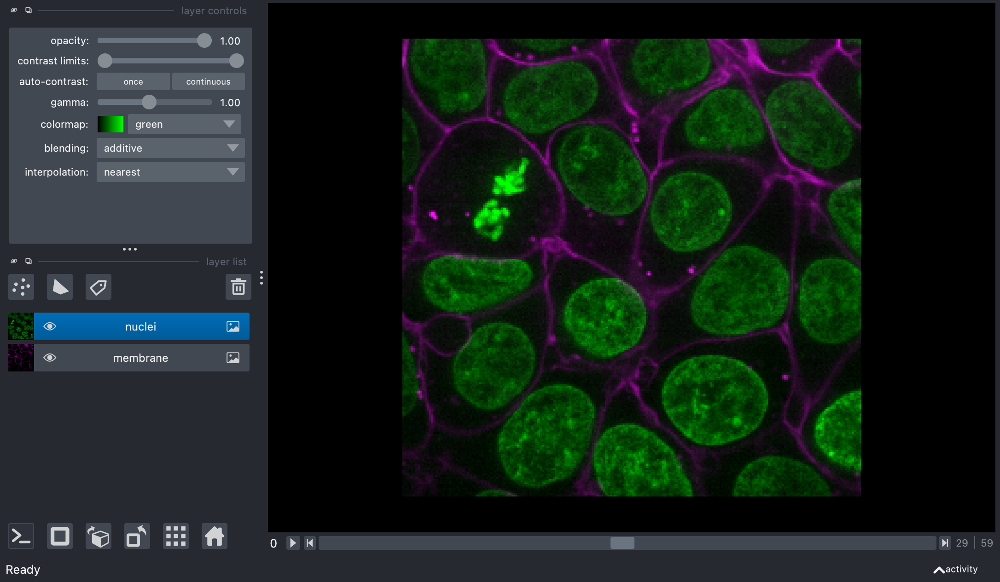

In [125]:
nbscreenshot(viewer)

## Elements of the viewer

In the above image we see the four essential elements of the napari interface:

### The canvas

The canvas is where the image gets displayed. With the mouse you can move the image around (click and drag) or zoom in/out (wheel or two fingers on trackpad. Or you can edit the viewer:

In [126]:
viewer.camera.zoom = 0.68
viewer.camera.center = (0, 120, -250)

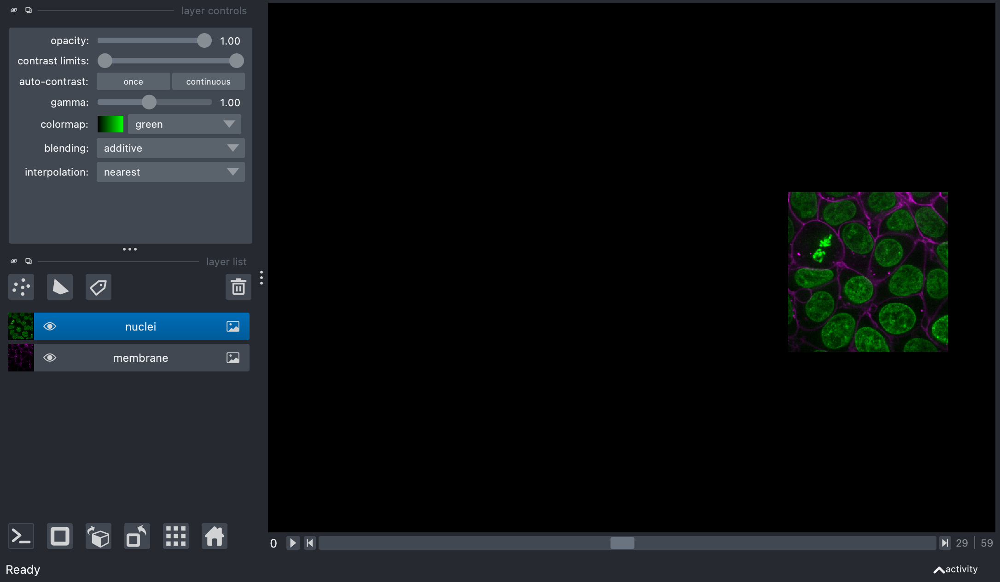

In [127]:
nbscreenshot(viewer, alt_text='Initial window')

### The dimension slider

When importing multi-dimensional data, the image is always shown by default first in 2D with a set of sliders to move across planes. You can access some dimension functionalities via the ```dims``` property:

In [128]:
viewer.dims

Dims(ndim=3, ndisplay=2, last_used=0, range=((0.0, 60.0, 1.0), (0.0, 256.0, 1.0), (0.0, 256.0, 1.0)), current_step=(29, 127, 127), order=(0, 1, 2), axis_labels=('0', '1', '2'))

In [129]:
viewer.dims.current_step = (50, 0, 0)

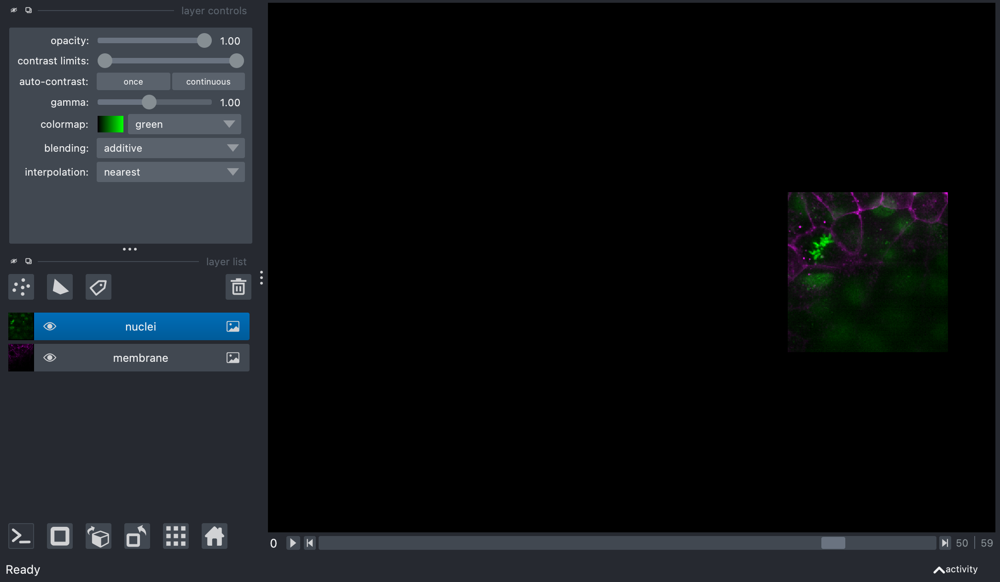

In [130]:
nbscreenshot(viewer, alt_text='Initial window')

### The layer list

Unlike Fiji which creates a new window for each new element (e.g. when you split channels of an image), napari adds all images to the same viewer but organizes them into **layers** like Illustrator for example. In the user interface you need to select the layer you want to work on and using the buttons you can also add layers of different types (more about those later).

Layer properties can be edited interactively e.g. their name and order. Or via the ```layers``` property:

In [131]:
viewer.layers

[<Image layer 'membrane' at 0x2c6290940>, <Image layer 'nuclei' at 0x2c6371720>]

Each single layer can be access by index or by name:

In [132]:
viewer.layers[1]

<Image layer 'nuclei' at 0x2c6371720>

In [133]:
viewer.layers['nuclei']

<Image layer 'nuclei' at 0x2c6371720>

One can reset the name:

In [134]:
viewer.layers['nuclei'].name = 'nucleus'

and move layer order:

In [135]:
viewer.layers.move(1,0)

True

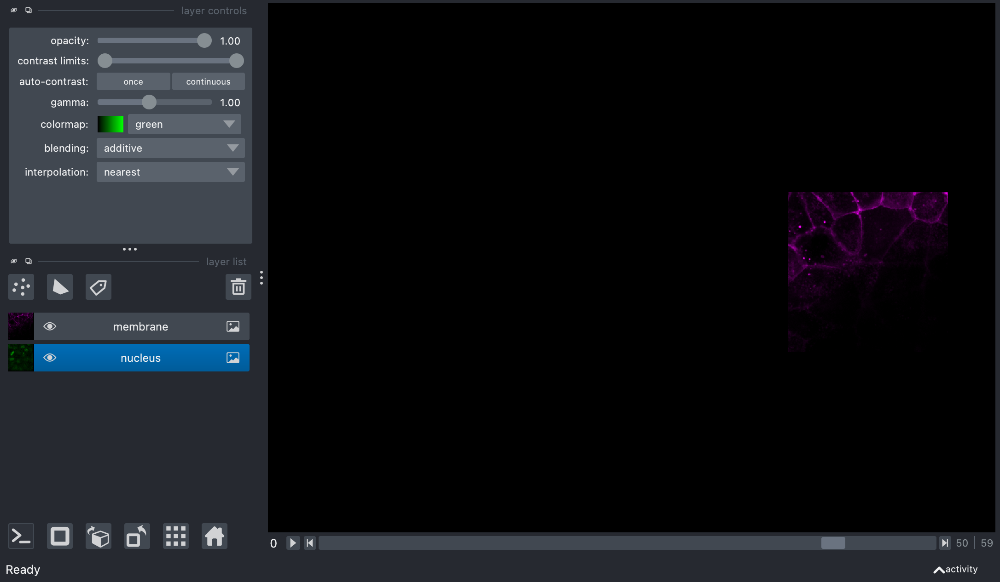

In [136]:
nbscreenshot(viewer)

In addition certain operations are accessible by right-clicking on the layers. For example you can split a stack into singel channesl, merge them, perform projections etc.

### Layer controls

The layer controls on the top left of the viewer allow you to control every aspect of the rendering of the *selected* layer. Of course properties will vary depending on the layer type. Those properties can mostly be also programmatically edited via each layer. For example we can change the colormap and the blending of the ```membrane``` layer:

In [137]:
viewer.reset_view()

In [138]:
viewer.layers['membrane'].colormap = 'inferno'
viewer.layers['membrane'].blending = 'additive'

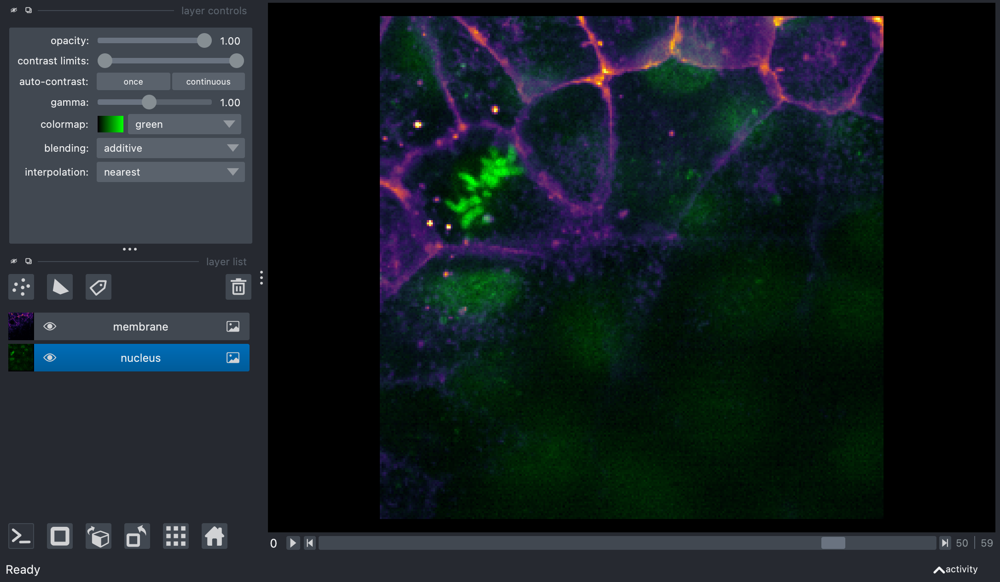

In [139]:
nbscreenshot(viewer)

### Bottom toolbar

The buttons on the lower left control the dimensional rendering of the data (except for the very first one which gives access to a scripting editor). For example to switch between 2D slice view and 3D volume view one can hit the second button. The same is achieved with by editing a ```dims``` property:

In [140]:
viewer.dims.ndisplay = 3
viewer.camera.angles = (-20,11,-64)

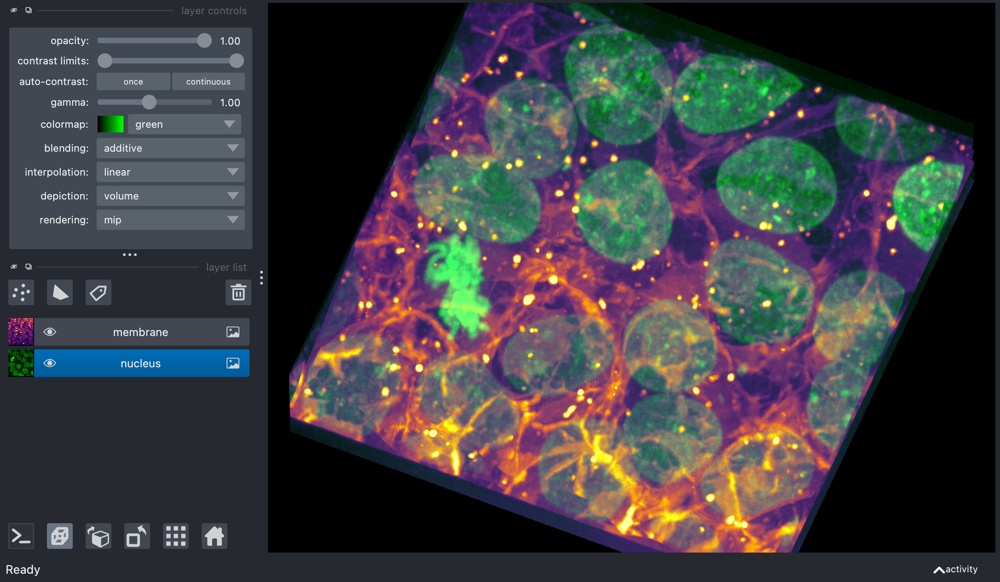

In [141]:
nbscreenshot(viewer)

### Layer properties

Note that certain changes can only be made via code. For example if you want to change the scaling factor of one of the dimensions, you will have to use the ```scale``` property of the layer:

In [142]:
viewer.layers['nucleus'].scale = [3,1,1]

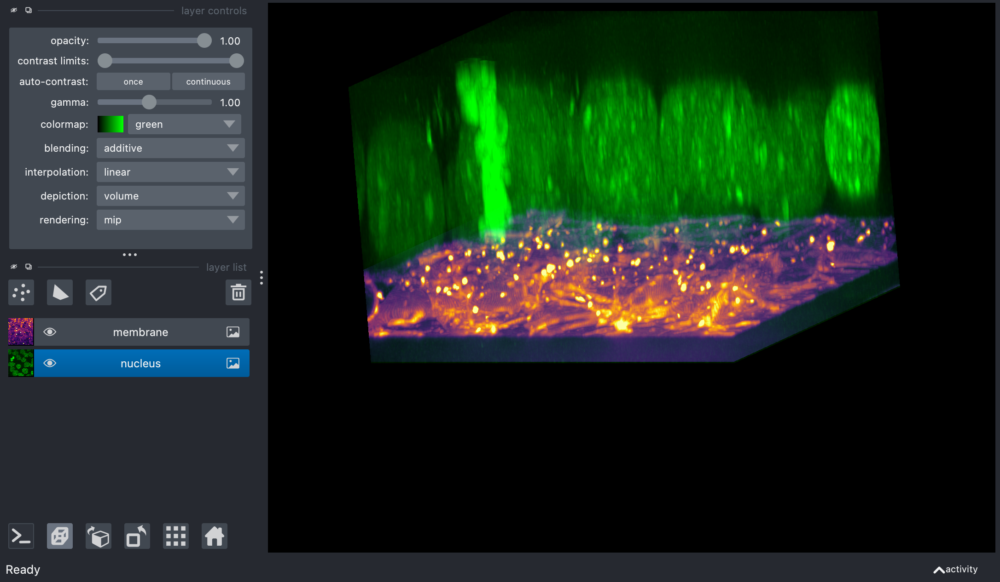

In [143]:
viewer.camera.angles = (0,25,-11)
viewer.camera.zoom = 1.7 
nbscreenshot(viewer)

## Data in the viewer

In addition to the editing features described above, the viewer object gives access to the displayed data and also allows to add new data to it directly.

Accessing the data happens via the layers again:

In [144]:
data = viewer.layers['nucleus'].data

In [145]:
type(data)

numpy.ndarray

In [146]:
data.shape

(60, 256, 256)

As you can see above the data are simply NumPy arrays. Those can be modified in place:

In [147]:
viewer.reset_view()
viewer.dims.ndisplay = 2
viewer.dims.current_step = (100,0,0)
viewer.layers['membrane'].visible = False

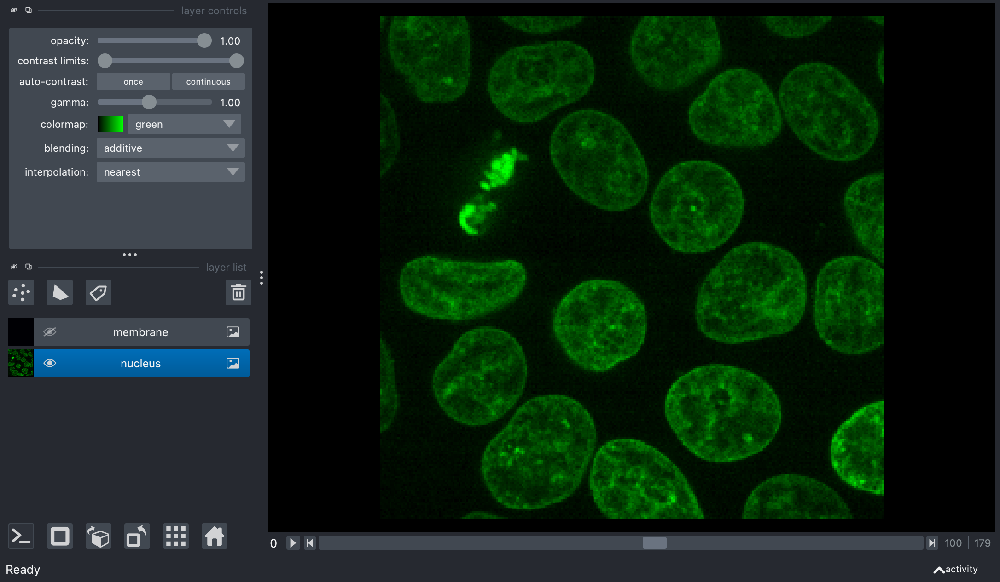

In [148]:
nbscreenshot(viewer)

In [149]:
import numpy as np
viewer.layers['nucleus'].data += np.random.randint(0,10000, data.shape).astype(np.uint16)

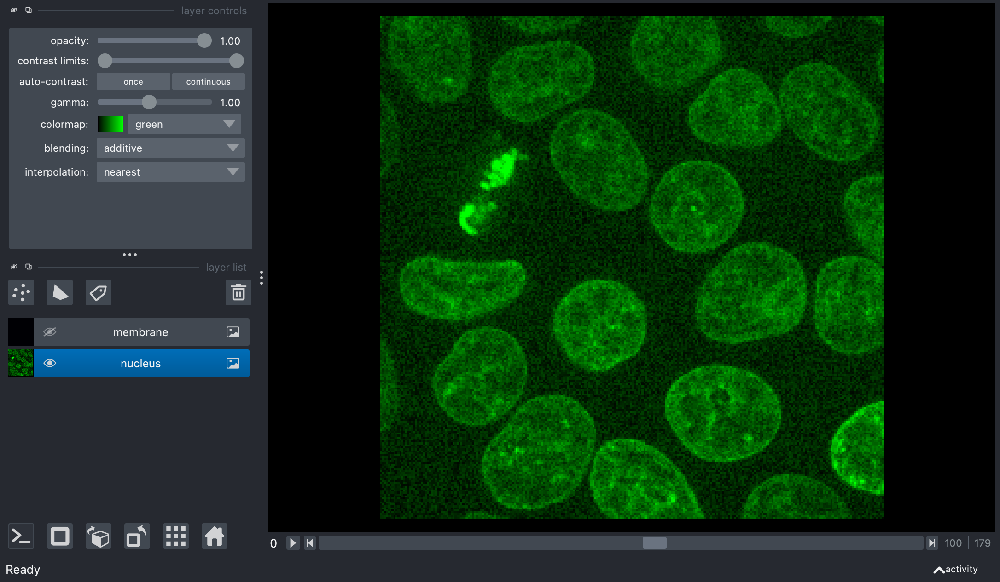

In [150]:
nbscreenshot(viewer)

Finally we can also add data to the viewer. In the case of images we do it via the ```add_image``` method. There one can directly specify options when adding the image to the viewer. We create now some random image:

In [151]:
rand_im = np.random.normal(10000,100, data.shape).astype(np.uint16)

viewer.add_image(rand_im, colormap='orange', blending='additive')

<Image layer 'rand_im' at 0x2c63eb970>

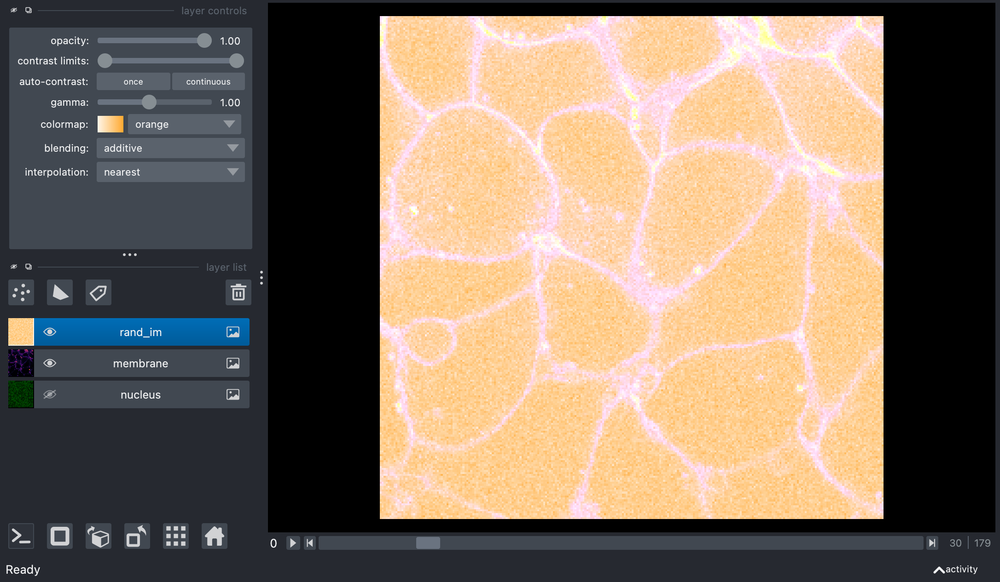

In [155]:
viewer.dims.current_step = (30,0,0)

viewer.layers['nucleus'].visible = False
viewer.layers['membrane'].visible = True
viewer.reset_view()
nbscreenshot(viewer)

Finally it is possible to take screenshots of the currently displayed images including or excluding the viewer interface. Note that the image is **a regular RGB image** copying the viewer and not an actual stack of image containing the raw information. The RGB picture can be displayed with ```plt.imshow```:

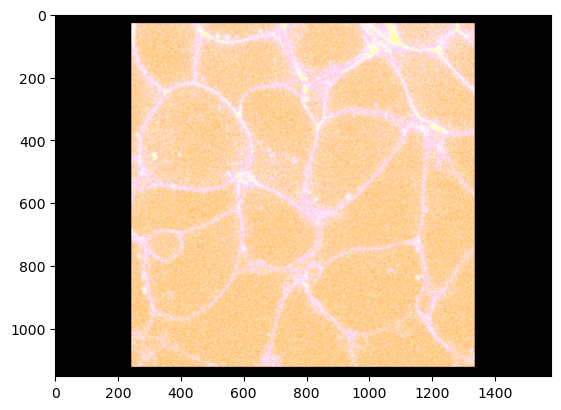

In [156]:
import matplotlib.pyplot as plt

screenshot = viewer.screenshot()
plt.imshow(screenshot);

## Exercise

1. Create a viewer
2. Using ```viewer.open``` add the ```cow3d.tiff``` file to the viewer
3. This is a 3d multi-channel image. Make sure you understand what the sliders do
4. Split the channels by right-clicking on the layer and using ```Split stack```
5. Explore layer editing tools: contrast, colormaps etc.
6. Move to 3D visualization and explore. Knowing the Z axis is three times larger than XY, adjust the scale
7. Remove all layers
8. Import the same image, this time with ```skimage.io.imread```
9. Add the image to the viewer using the ```add_image``` function
10. That function has a ```channel_axis``` option. Try to figure out what it does and how you can use it with your data
11. Save a snapshot of the image